# Self-Driving Car Engineer Nanodegree

## Project: Build a Traffic Sign Recognition Classifier

---
## Overview
The goal of this project is to build a convolution neural network in Keras that clones a driver's behavior and predicts steering angles from images. The model I built could successfully drive around track one without leaving the road. The following animation shows how the car drives on the lake side track.

[Animation Place holder]()

My project includes the following files:

`model.py` containing the script to create and train the model  
`utils.py` containing all the utilities functions  
`drive.py` for driving the car in autonomous mode  
`model.h5` containing a trained convolution neural network  
`README.md` summarizing the results  


In [1]:
"""
Finding the correction matrix and distortion coefficients
"""

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
image_names = glob.glob('camera_cal/calibration*.jpg')
image_names.sort()

# Step through the list and search for chessboard corners
for idx, fname in enumerate(image_names):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (img.shape[1], img.shape[0])
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

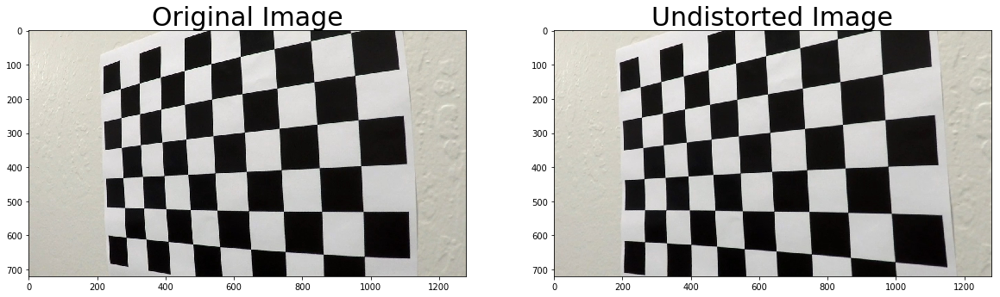

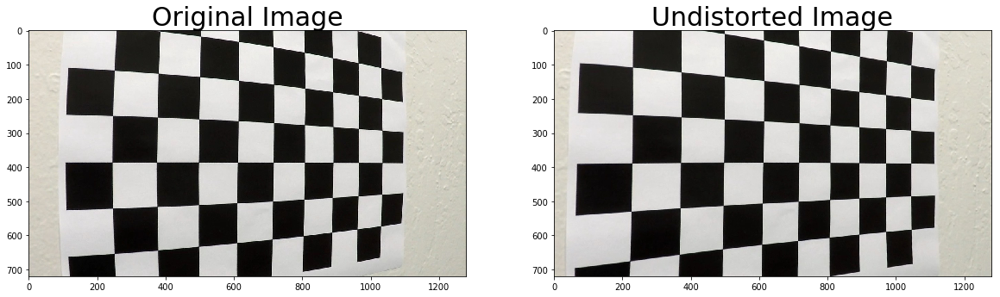

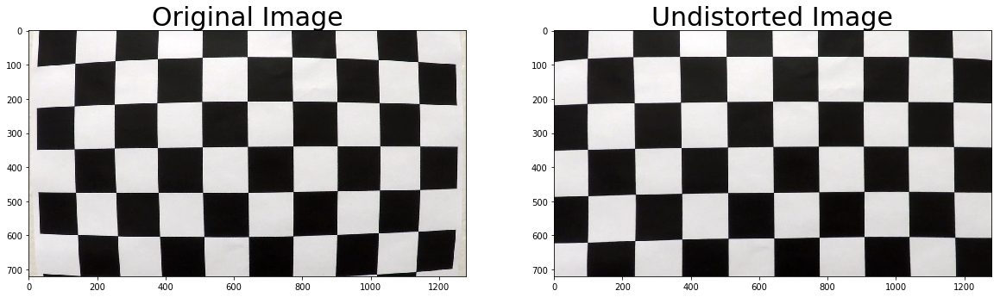

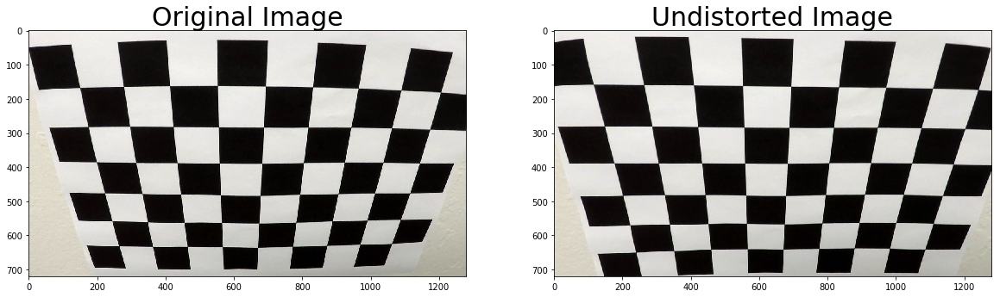

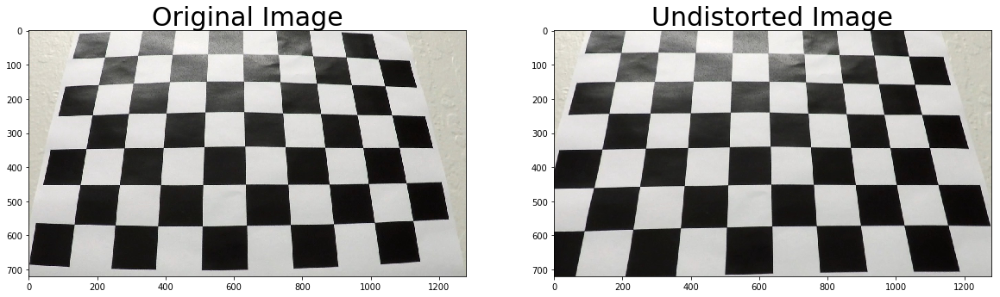

In [2]:
"""
Undistort the images
"""

import pickle
import os
%matplotlib inline

def undistort(mtx, dist, img_in_path, img_out_path='', plot=False):
    # Test undistortion on an image
    img = cv2.imread(img_in_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if img_out_path:
        cv2.imwrite(img_out_path,dst)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return dst

image_in_folder = 'camera_cal/'
image_out_folder = 'camera_cal_output/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
chessboard_undists = []
for file in files:
    chessboard_undists.append(undistort(mtx,dist,
                              os.path.join(image_in_folder,file),
                              os.path.join(image_out_folder,file),
                              plot=True))

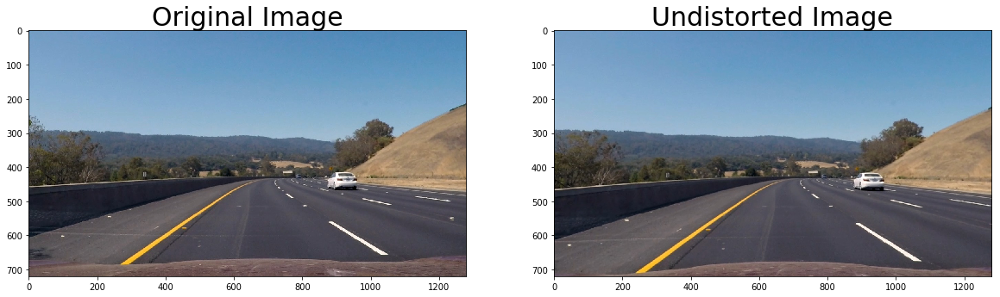

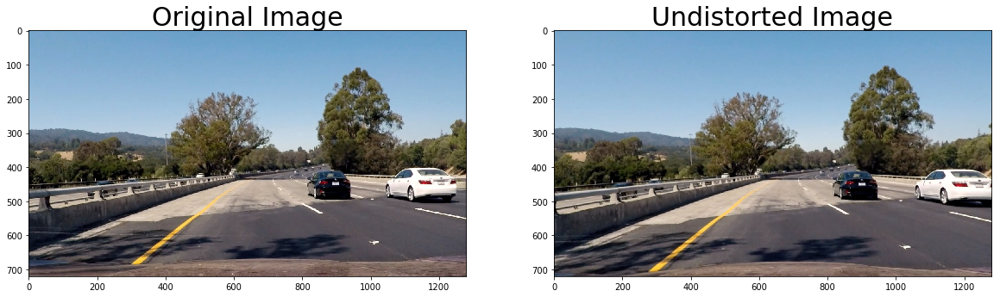

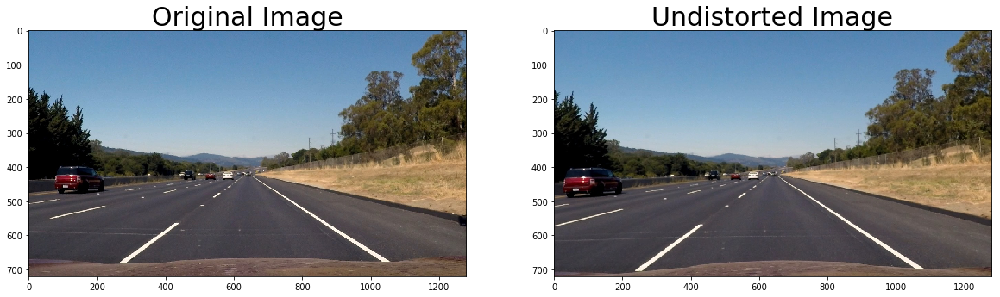

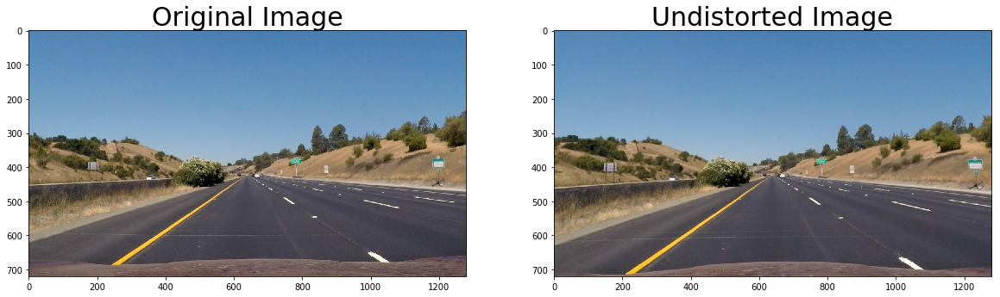

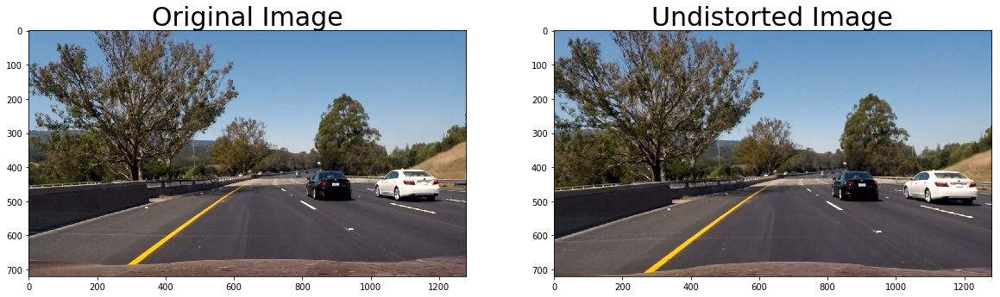

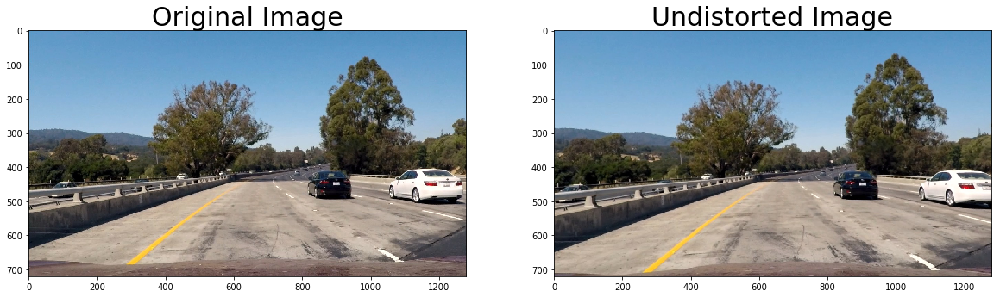

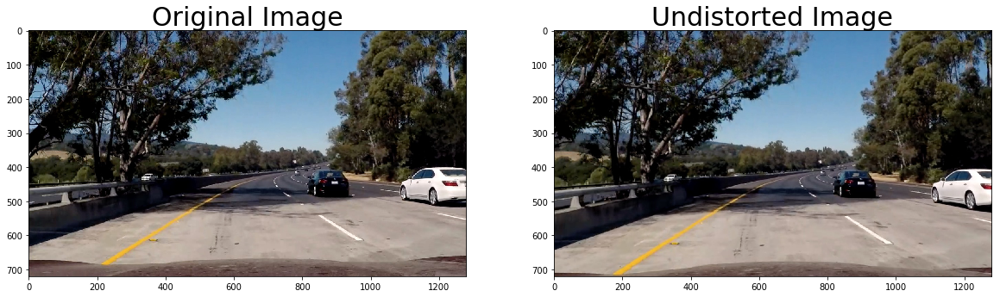

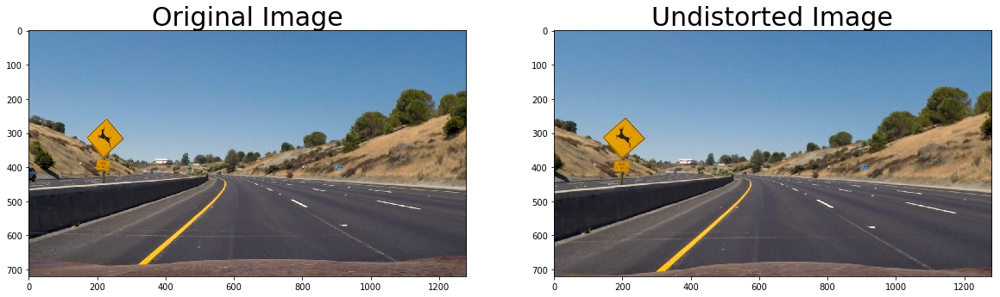

In [3]:
image_in_folder = 'test_images/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
images = []
for file in files:
    images.append(undistort(mtx,dist,
                            os.path.join(image_in_folder,file),
                            plot = True))

In [70]:
def abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=200):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(90, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# X,Y
img_size = (1280, 720)

# MMa 2017-06-27 Why it failed immediately when top source points are less then half of the height ??!
src = np.float32([ [img_size[0]/2-116,img_size[1]/2+150],
                    [img_size[0]/2+116,img_size[1]/2+150],
                    [img_size[0]/2+320,img_size[1]],
                    [img_size[0]/2-320,img_size[1]]])

offset_x = 300 # offset for dst points
offset_y = 400
dst = np.float32([ [offset_x, offset_y], 
                    [img_size[0]-offset_x, offset_y], 
                    [img_size[0]-offset_x, img_size[1]], 
                    [offset_x, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
    
def binary_warp(img, mtx, dist):
    hls_binary = hls_select(img, thresh=(50, 255))
    img_new = cv2.undistort(hls_binary, mtx, dist, None, mtx)
    warped = cv2.warpPerspective(img_new, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def poly_fit(img):
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     print("left base {},right base {}".format(leftx_base,rightx_base))

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
#     print("Using window height {}".format(window_height))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
#     print(left_fit)
#     print(right_fit)
    return left_fit, right_fit

# def poly_fit(img,left_fit,right_fit):
#     # Assume you now have a new warped binary image 
#     # from the next frame of video (also called "binary_warped")
#     # It's now much easier to find line pixels!
#     nonzero = binary_warped.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])
#     margin = 100
#     left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
#                       (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
#     right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
#                        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

#     # Again, extract left and right line pixel positions
#     leftx = nonzerox[left_lane_inds]
#     lefty = nonzeroy[left_lane_inds] 
#     rightx = nonzerox[right_lane_inds]
#     righty = nonzeroy[right_lane_inds]
    
#     # Fit a second order polynomial to each
#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)

#     return left_fitx, right_fit

def curvature(ploty,leftx,rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
#     print(left_fit_cr[0]*y_eval*ym_per_pix, 'm', right_fit_cr[0]*y_eval*ym_per_pix, 'm')
    return left_curverad,right_curverad

def draw_lane(img,ploty,left_fitx,right_fitx):
    img_new = img.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = warp_zero #np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    img_new = cv2.addWeighted(img_new, 1, newwarp, 0.3, 0)
    return img_new

def draw_info(img, curv, center_dist):
    img_new = np.copy(img)
    h = img_new.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Curvature : {:4.2f}'.format(curv) + 'm'
    cv2.putText(img_new, text, (40,70), font, 1, (255,255,255), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:4.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(img_new, text, (40,120), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return img_new

def pipeline(img):
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    hls_binary = hls_select(undistort, thresh=(100, 255))
    warped = cv2.warpPerspective(hls_binary, M, img_size, flags=cv2.INTER_LINEAR)
    left_fit,right_fit = poly_fit(warped)
    if left_fit == None or right_fit == None:
        return img
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    curv_left, curv_right = curvature(ploty,left_fitx,right_fitx)
    result = draw_lane(undistort,ploty,left_fitx,right_fitx)
    result = draw_info(result,(curv_left+curv_right)/2,0)
    return result

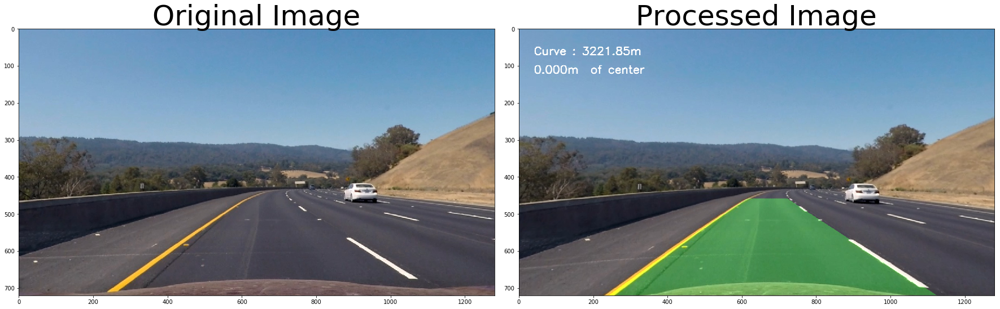

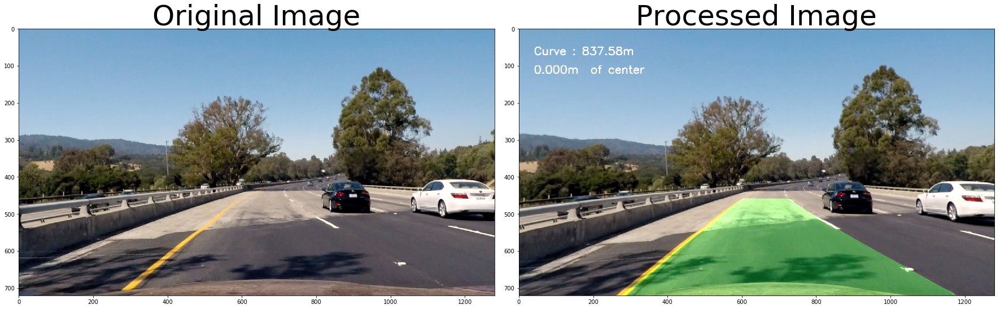

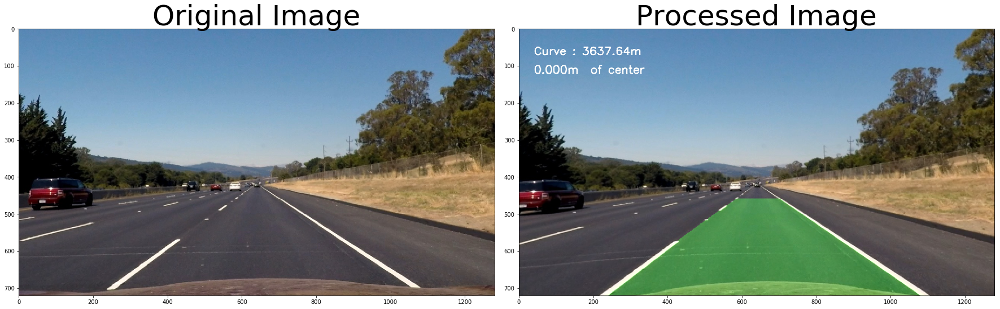

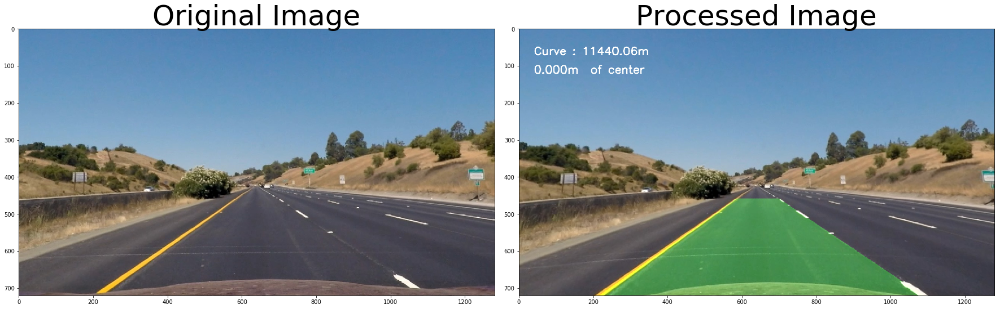

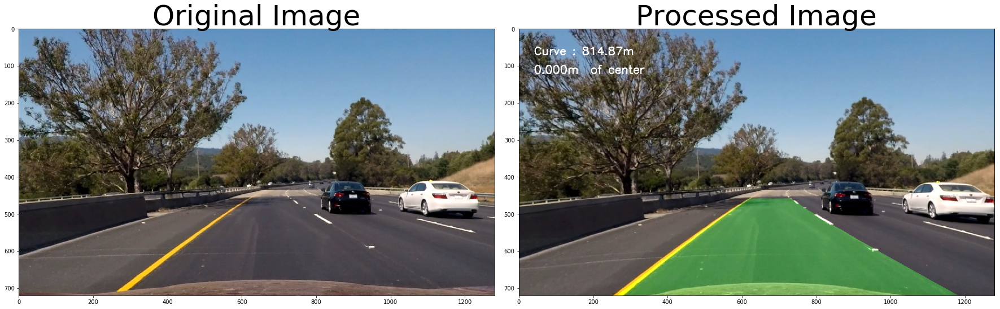

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


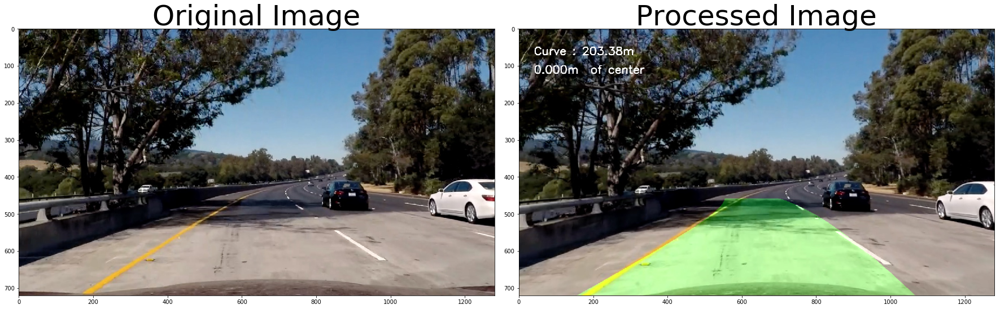

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [69]:
for image in images:
    image_new = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(image_new)
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()

In [65]:
from moviepy.editor import VideoFileClip

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(pipeline)
processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<02:17,  9.14it/s]

  0%|          | 2/1261 [00:00<02:21,  8.91it/s]

  0%|          | 4/1261 [00:00<02:09,  9.74it/s]

  0%|          | 6/1261 [00:00<02:01, 10.30it/s]

  1%|          | 8/1261 [00:00<01:54, 10.94it/s]

  1%|          | 10/1261 [00:00<01:46, 11.70it/s]

  1%|          | 12/1261 [00:00<01:41, 12.31it/s]

  1%|          | 14/1261 [00:01<01:38, 12.71it/s]

  1%|▏         | 16/1261 [00:01<01:37, 12.78it/s]

  1%|▏         | 18/1261 [00:01<01:35, 13.06it/s]

  2%|▏         | 20/1261 [00:01<01:35, 12.98it/s]

  2%|▏         | 22/1261 [00:01<01:35, 12.92it/s]

  2%|▏         | 24/1261 [00:01<01:33, 13.24it/s]

  2%|▏         | 26/1261 [00:02<01:34, 13.14it/s]

  2%|▏         | 28/1261 [00:02<01:32, 13.31it/s]

  2%|▏         | 30/1261 [00:02<01:33, 13.23it/s]

  3%|▎         | 32/1261 [00:02<01:32, 13.24it/s]

  3%|▎         | 34/1261 [00:02<01:33, 13.18it/s]

  3%|▎         | 36/1261 [00:02<01:32, 13.1

 22%|██▏       | 282/1261 [00:22<01:17, 12.56it/s]

 23%|██▎       | 284/1261 [00:22<01:16, 12.80it/s]

 23%|██▎       | 286/1261 [00:22<01:15, 12.92it/s]

 23%|██▎       | 288/1261 [00:23<01:15, 12.88it/s]

 23%|██▎       | 290/1261 [00:23<01:15, 12.87it/s]

 23%|██▎       | 292/1261 [00:23<01:15, 12.89it/s]

 23%|██▎       | 294/1261 [00:23<01:15, 12.82it/s]

 23%|██▎       | 296/1261 [00:23<01:17, 12.43it/s]

 24%|██▎       | 298/1261 [00:23<01:15, 12.73it/s]

 24%|██▍       | 300/1261 [00:24<01:14, 12.92it/s]

 24%|██▍       | 302/1261 [00:24<01:15, 12.72it/s]

 24%|██▍       | 304/1261 [00:24<01:14, 12.88it/s]

 24%|██▍       | 306/1261 [00:24<01:15, 12.67it/s]

 24%|██▍       | 308/1261 [00:24<01:15, 12.62it/s]

 25%|██▍       | 310/1261 [00:24<01:15, 12.66it/s]

 25%|██▍       | 312/1261 [00:24<01:14, 12.66it/s]

 25%|██▍       | 314/1261 [00:25<01:13, 12.85it/s]

 25%|██▌       | 316/1261 [00:25<01:14, 12.75it/s]

 25%|██▌       | 318/1261 [00:25<01:14, 12.67it/s]

 25%|██▌    

 45%|████▍     | 564/1261 [00:45<01:02, 11.11it/s]

 45%|████▍     | 566/1261 [00:45<01:01, 11.27it/s]

 45%|████▌     | 568/1261 [00:45<01:00, 11.52it/s]

 45%|████▌     | 570/1261 [00:46<00:58, 11.89it/s]

 45%|████▌     | 572/1261 [00:46<00:56, 12.18it/s]

 46%|████▌     | 574/1261 [00:46<00:56, 12.19it/s]

 46%|████▌     | 576/1261 [00:46<00:56, 12.15it/s]

 46%|████▌     | 578/1261 [00:46<00:55, 12.24it/s]

 46%|████▌     | 580/1261 [00:46<00:55, 12.34it/s]

 46%|████▌     | 582/1261 [00:47<00:54, 12.55it/s]

 46%|████▋     | 584/1261 [00:47<00:53, 12.57it/s]

 46%|████▋     | 586/1261 [00:47<00:53, 12.72it/s]

 47%|████▋     | 588/1261 [00:47<00:51, 13.07it/s]

 47%|████▋     | 590/1261 [00:47<00:51, 13.08it/s]

 47%|████▋     | 592/1261 [00:47<00:51, 13.04it/s]

 47%|████▋     | 594/1261 [00:48<00:51, 12.97it/s]

 47%|████▋     | 596/1261 [00:48<00:51, 12.96it/s]

 47%|████▋     | 598/1261 [00:48<00:51, 12.97it/s]

 48%|████▊     | 600/1261 [00:48<00:52, 12.66it/s]

 48%|████▊  

 67%|██████▋   | 846/1261 [01:08<00:34, 12.08it/s]

 67%|██████▋   | 848/1261 [01:08<00:34, 12.07it/s]

 67%|██████▋   | 850/1261 [01:08<00:34, 12.06it/s]

 68%|██████▊   | 852/1261 [01:08<00:33, 12.30it/s]

 68%|██████▊   | 854/1261 [01:09<00:33, 12.27it/s]

 68%|██████▊   | 856/1261 [01:09<00:32, 12.33it/s]

 68%|██████▊   | 858/1261 [01:09<00:32, 12.23it/s]

 68%|██████▊   | 860/1261 [01:09<00:32, 12.18it/s]

 68%|██████▊   | 862/1261 [01:09<00:32, 12.27it/s]

 69%|██████▊   | 864/1261 [01:09<00:32, 12.27it/s]

 69%|██████▊   | 866/1261 [01:10<00:32, 12.04it/s]

 69%|██████▉   | 868/1261 [01:10<00:31, 12.30it/s]

 69%|██████▉   | 870/1261 [01:10<00:31, 12.55it/s]

 69%|██████▉   | 872/1261 [01:10<00:31, 12.25it/s]

 69%|██████▉   | 874/1261 [01:10<00:31, 12.16it/s]

 69%|██████▉   | 876/1261 [01:10<00:31, 12.05it/s]

 70%|██████▉   | 878/1261 [01:11<00:32, 11.89it/s]

 70%|██████▉   | 880/1261 [01:11<00:31, 12.01it/s]

 70%|██████▉   | 882/1261 [01:11<00:31, 12.01it/s]

 70%|███████

 89%|████████▉ | 1126/1261 [01:31<00:11, 12.17it/s]

 89%|████████▉ | 1128/1261 [01:31<00:10, 12.35it/s]

 90%|████████▉ | 1130/1261 [01:31<00:10, 12.64it/s]

 90%|████████▉ | 1132/1261 [01:31<00:10, 12.87it/s]

 90%|████████▉ | 1134/1261 [01:32<00:09, 13.10it/s]

 90%|█████████ | 1136/1261 [01:32<00:09, 12.70it/s]

 90%|█████████ | 1138/1261 [01:32<00:09, 12.64it/s]

 90%|█████████ | 1140/1261 [01:32<00:09, 12.63it/s]

 91%|█████████ | 1142/1261 [01:32<00:09, 12.81it/s]

 91%|█████████ | 1144/1261 [01:32<00:09, 12.34it/s]

 91%|█████████ | 1146/1261 [01:33<00:09, 12.69it/s]

 91%|█████████ | 1148/1261 [01:33<00:09, 12.53it/s]

 91%|█████████ | 1150/1261 [01:33<00:08, 12.75it/s]

 91%|█████████▏| 1152/1261 [01:33<00:08, 12.71it/s]

 92%|█████████▏| 1154/1261 [01:33<00:08, 12.59it/s]

 92%|█████████▏| 1156/1261 [01:33<00:08, 12.33it/s]

 92%|█████████▏| 1158/1261 [01:34<00:08, 12.27it/s]

 92%|█████████▏| 1160/1261 [01:34<00:08, 12.19it/s]

 92%|█████████▏| 1162/1261 [01:34<00:07, 12.48

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

